In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy import stats
#from sklearn.cross_validation import KFold, cross_val_score, train_test_split

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize 
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import mean_squared_error as mse
from sklearn.feature_selection import RFECV
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.feature_selection import SelectKBest
from sklearn import datasets
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings("ignore")

# data set import

In [2]:
cols = ['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32']

In [3]:
data = pd.read_csv("wdbc.csv", names = cols, header = None)

In [4]:
df =  pd.read_csv("wdbc.csv", names = cols, header = None)

In [6]:
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [7]:
data = data.drop(['id','Unnamed: 32'], axis = 1) # , inplace = True

In [8]:
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [8]:
data.shape

(569, 31)

In [9]:
data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

# Descriptive Statistics

<AxesSubplot:xlabel='perimeter_worst', ylabel='Density'>

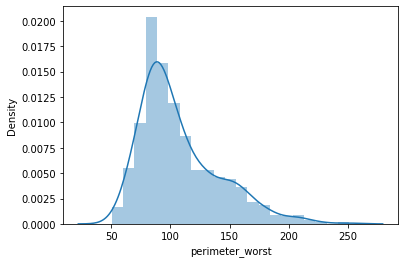

In [18]:
sns.distplot(data.perimeter_worst)

In [19]:
#function for plotting

def diag_plots(df, variable):
    
    """
    function to plot a histogram and a Q-Q plot
    side by side, for a certain variable
    """
    
    
    plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    df[variable].hist(bins=50)
    plt.title(variable)

    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title(variable)

    plt.show()

In [22]:
num_var = ['area_mean', 'smoothness_mean', 'compactness_mean']

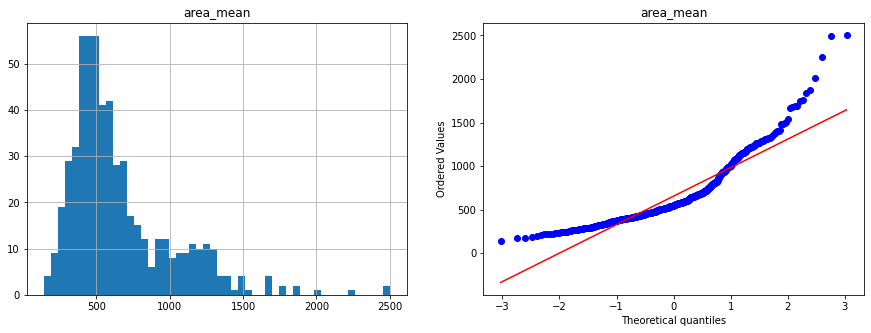

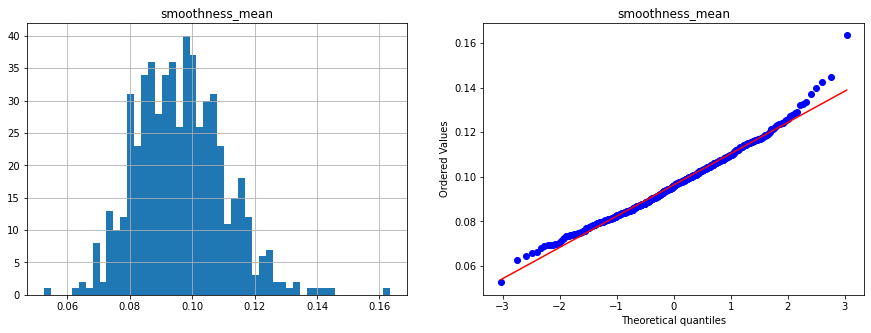

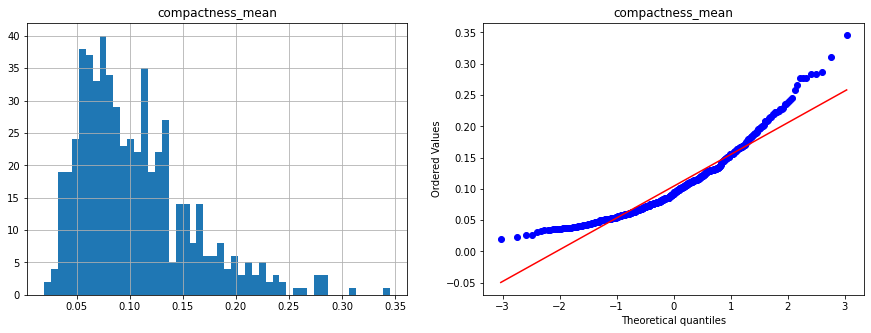

In [23]:
#applying the plotting fucntion 
for var in num_var:
    diag_plots(data,var)

In [24]:
df = data.copy()

In [25]:
#applying boxcox transformation
for var in num_var:
    df[var+"_boxcox"], param = stats.boxcox(df[var]) 


In [26]:
#list transformed variable
transformed = ["area_mean_boxcox","smoothness_mean_boxcox","compactness_mean_boxcox"]

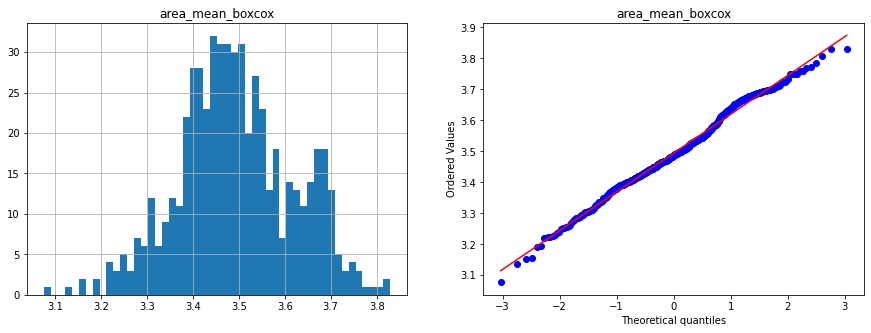

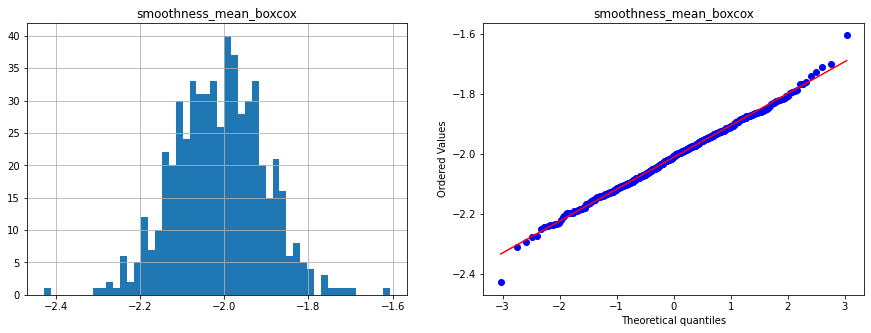

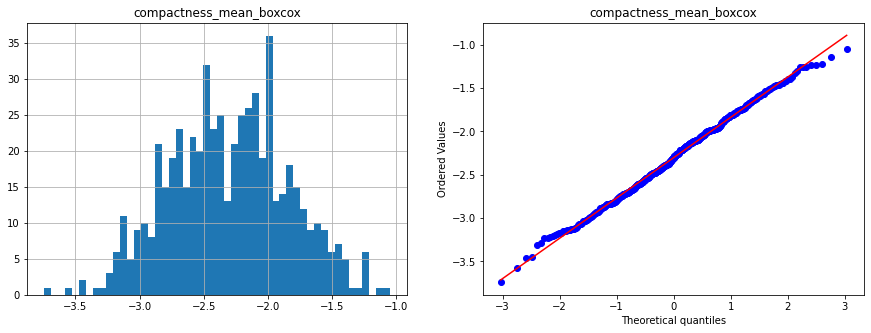

In [27]:
#ploting the transformed variable
for var in transformed:
    diag_plots(df,var)

<AxesSubplot:xlabel='area_mean_log'>

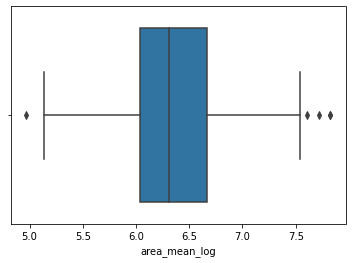

In [40]:
sns.boxplot(df.area_mean_log)

<AxesSubplot:xlabel='area_mean', ylabel='Density'>

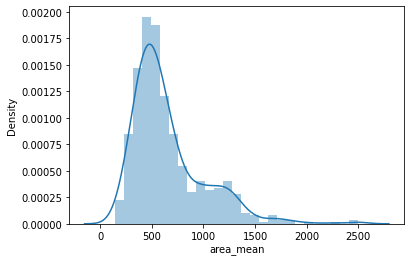

In [44]:
sns.distplot(df.area_mean)

<AxesSubplot:xlabel='area_mean_log', ylabel='Density'>

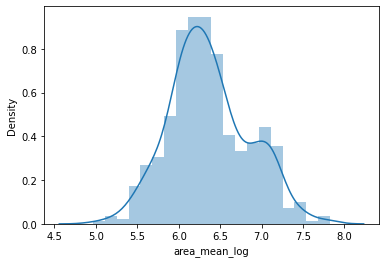

In [41]:
sns.distplot(df.area_mean_log)

<AxesSubplot:xlabel='area_mean_boxcox', ylabel='Density'>

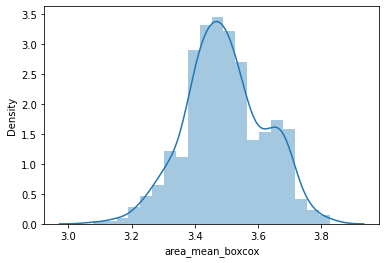

In [43]:
sns.distplot(df.area_mean_boxcox)

<AxesSubplot:xlabel='area_mean_boxcox'>

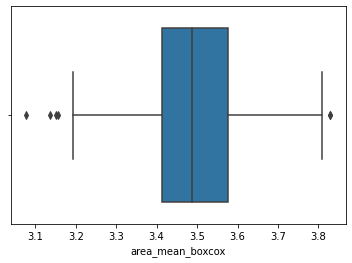

In [30]:
sns.boxplot(df.area_mean_boxcox)

<AxesSubplot:xlabel='area_mean'>

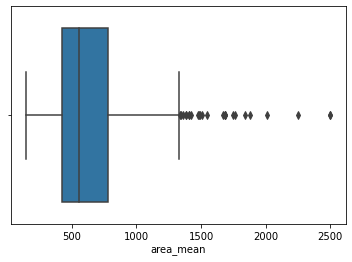

In [28]:
sns.boxplot(data.area_mean)

<AxesSubplot:xlabel='compactness_mean'>

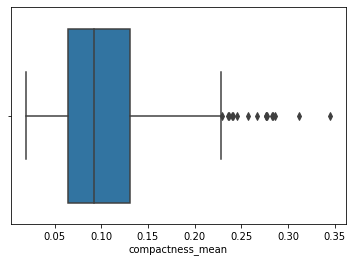

In [31]:
sns.boxplot(data.compactness_mean)

<AxesSubplot:xlabel='compactness_mean_boxcox'>

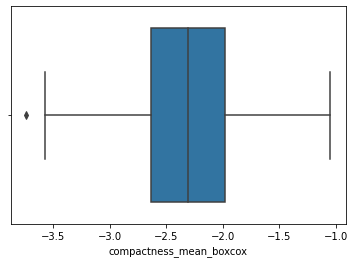

In [32]:
sns.boxplot(df.compactness_mean_boxcox)

# apply log transformations

In [34]:
#applying the transformation
for var in num_var:
    df[var+"_exp"] = df[var]**(1/4)

In [35]:
#list transformed variable
transformed = ["area_mean_exp","smoothness_mean_exp","compactness_mean_exp"]

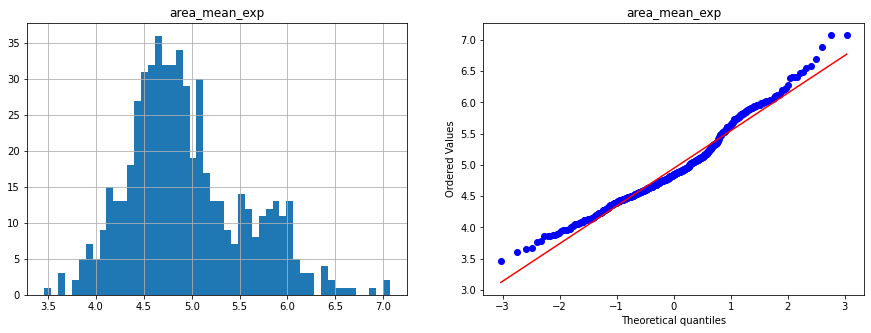

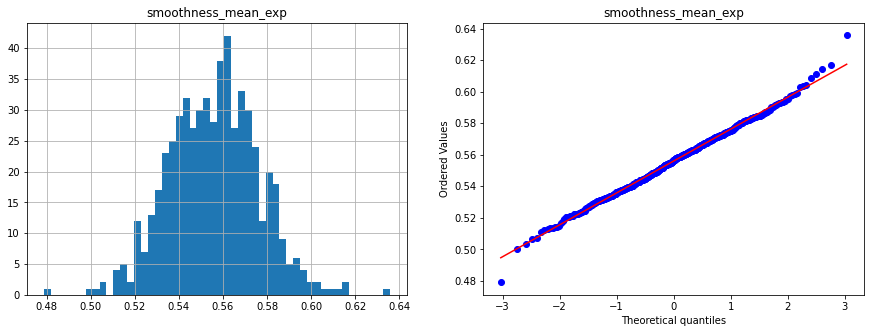

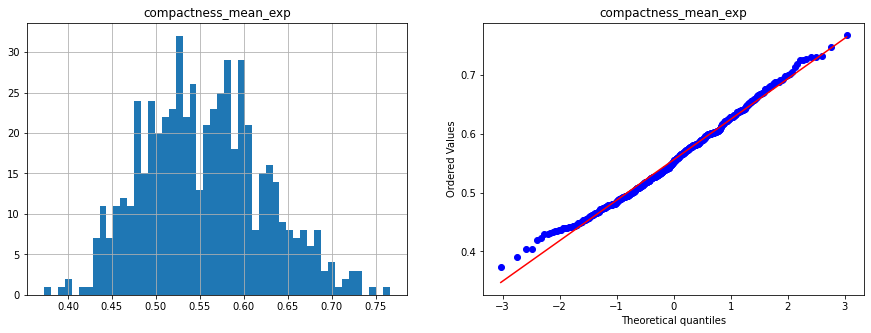

In [36]:
#ploting the transformed variable
for var in transformed:
    diag_plots(df,var)

In [37]:
#log transformation
for var in num_var:
    df[var+"_log"] = np.log(df[var])

In [38]:
#list transformed variable
transformed1 = ["area_mean_log","smoothness_mean_log","compactness_mean_log"]

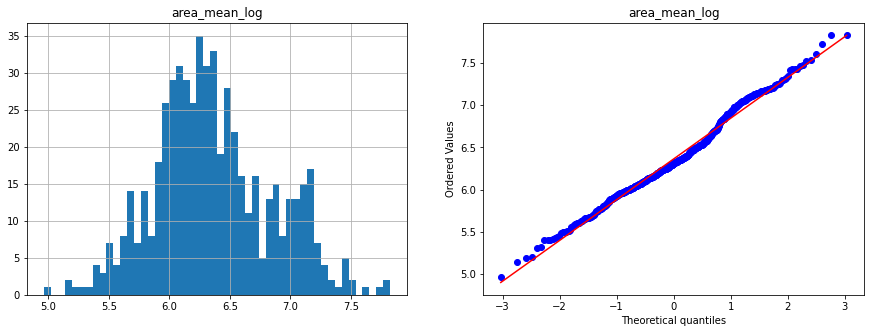

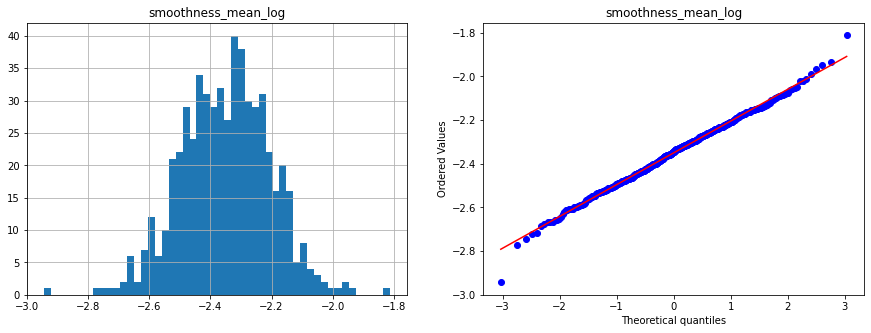

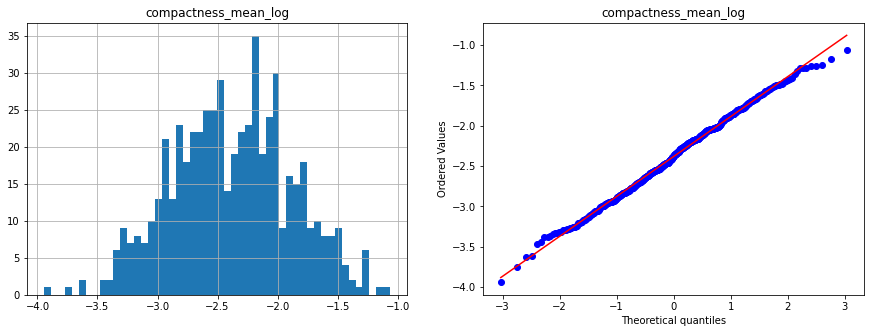

In [39]:
#applying the plotting function
for var in transformed1:
    diag_plots(df,var)

# Check for null value

In [9]:
data.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [11]:
#!pip install missingno

<AxesSubplot:>

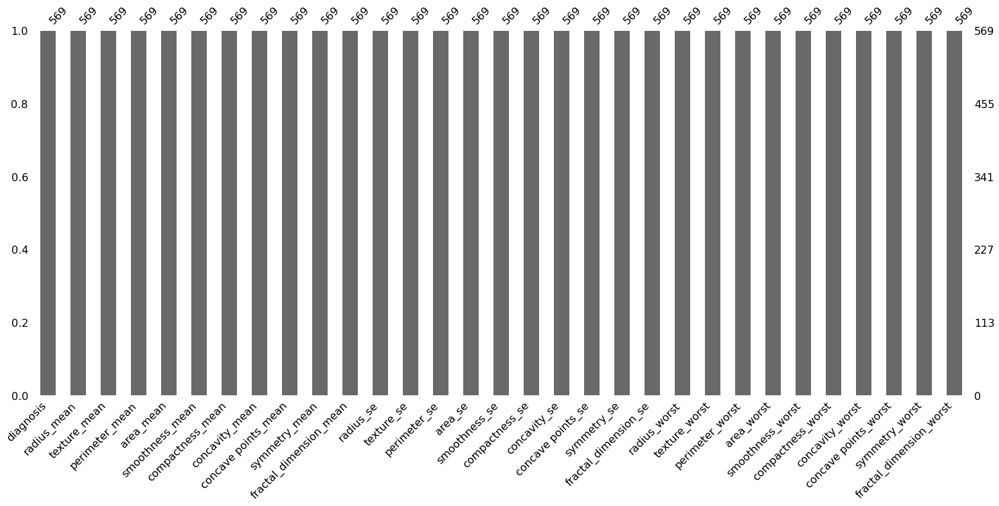

In [12]:
import missingno as msno
# Gives a bar chart of the missing values
msno.bar(data)

<AxesSubplot:>

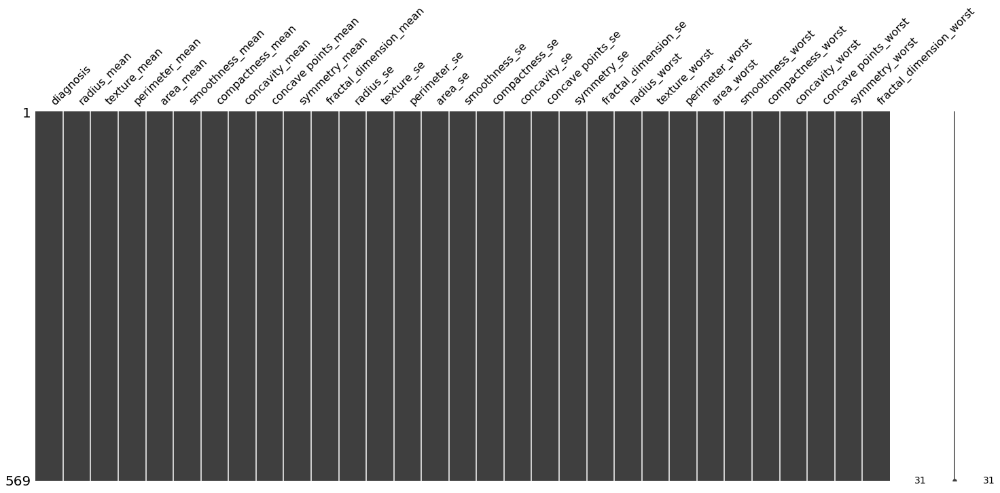

In [13]:
# Gives positional information of the missing values
msno.matrix(data)

<AxesSubplot:>

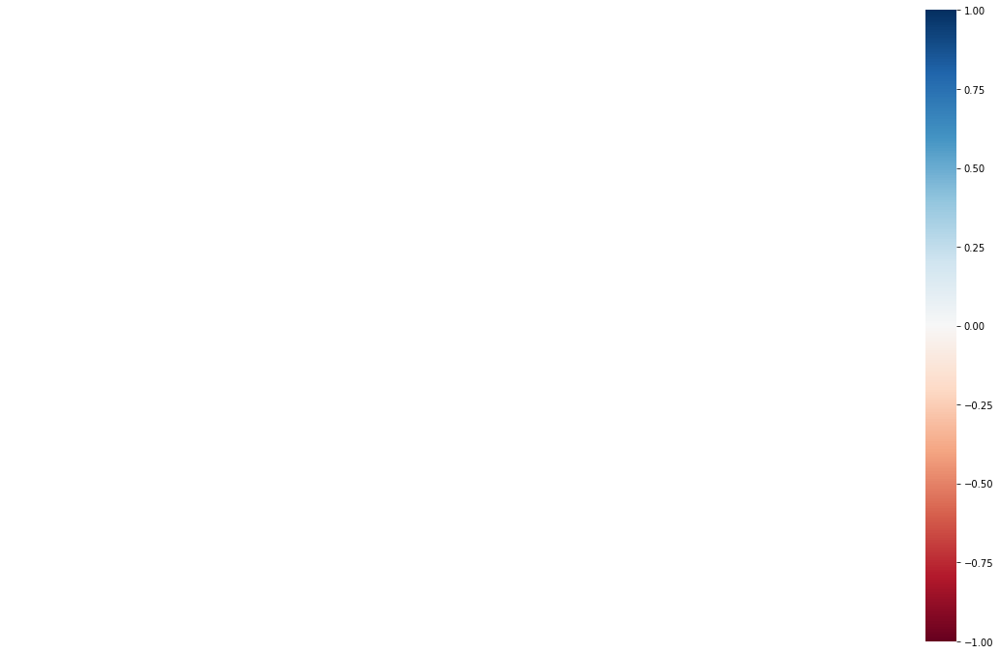

In [12]:
# Gives a heatmap of how missing values are related
msno.heatmap(data)

# 5 point summary

In [14]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


<AxesSubplot:xlabel='diagnosis', ylabel='count'>

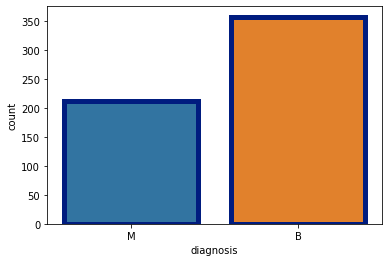

In [14]:
## understand the diagonosis data distribution
sns.countplot(x = 'diagnosis',linewidth=5, data = data,edgecolor=sns.color_palette("dark",1))

##### conclusion : the count of Benign is more than the Malignant

In [15]:
data['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [16]:
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [17]:
# Encoding the diagonosis feature
# Numerize diagnosis "M" malignant; "B" benign 
diagnosis_coder = {'M':1, 'B':0}
data.diagnosis = data.diagnosis.map(diagnosis_coder)

In [18]:
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


<AxesSubplot:xlabel='diagnosis', ylabel='count'>

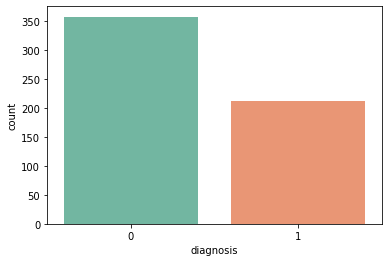

In [19]:
## understand the diagonosis data distribution
sns.countplot(x = 'diagnosis',linewidth=5, data = data,palette="Set2" ) #edgecolor=sns.color_palette("dark",1)

In [20]:
data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

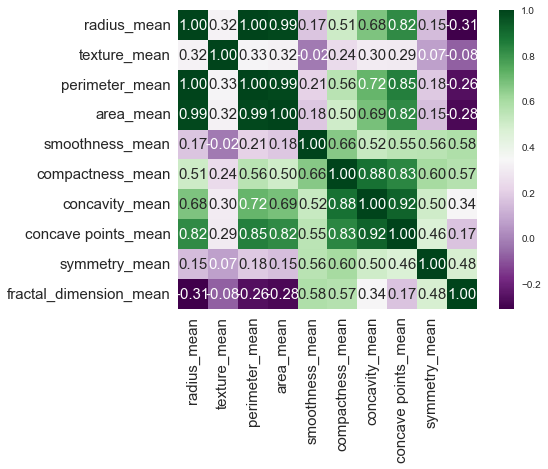

In [69]:
#From the feature names, we cann notice that there are three main categories 'value means', 'standard deviation' and 'worst'.
#Let us explore the correlation between sets of features
x = data.iloc[:, 1:]

features_mean = x.columns[:10]
features_se = x.columns[10:20]
features_worst = x.columns[20:]

corr = x[features_mean].corr()
g = sns.heatmap(corr, cbar = True, annot=True, annot_kws={'size': 15}, fmt= '.2f', square = True, cmap =  'PRGn')
g.set_xticklabels(rotation=90, labels = features_mean, size = 15)
g.set_yticklabels(rotation=0, labels = features_mean, size = 15)
g.set_xticks(np.arange(.5,9.5,1))
plt.rcParams["figure.figsize"] = (20,30)

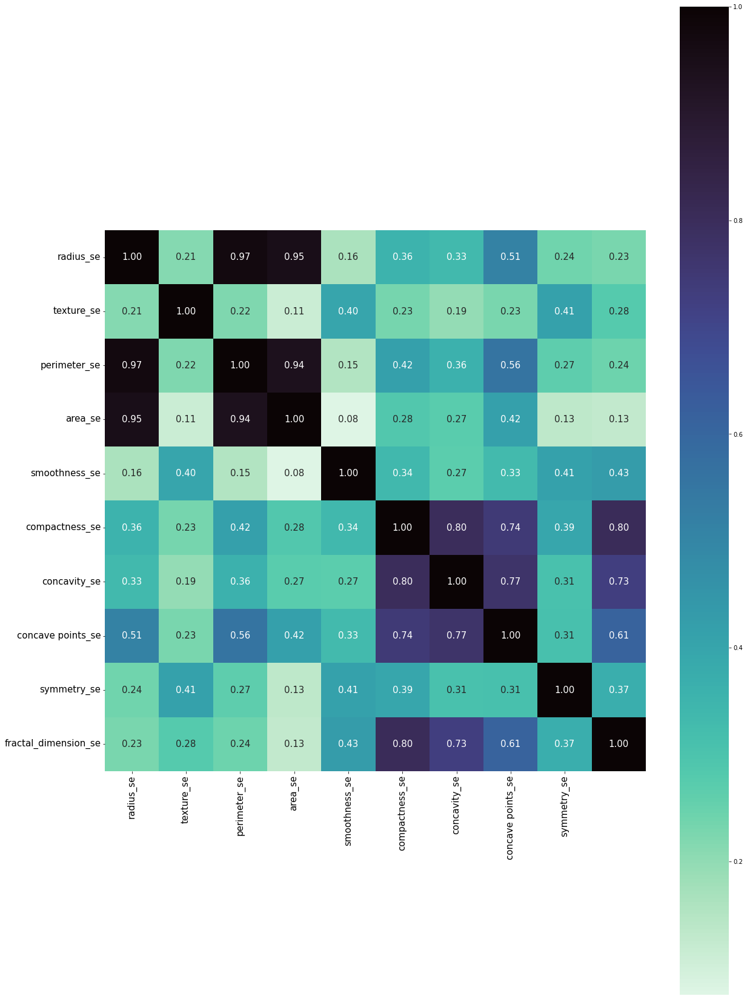

In [22]:
corr = x[features_se].corr()
g = sns.heatmap(corr, cbar = True, annot=True, annot_kws={'size': 15}, fmt= '.2f', square = True, cmap = 'mako_r')
g.set_xticklabels(rotation=90, labels = features_se, size = 15)
g.set_yticklabels(rotation=0, labels = features_se, size = 15)
g.set_xticks(np.arange(.5,9.5,1))
plt.rcParams["figure.figsize"] = (20,30)

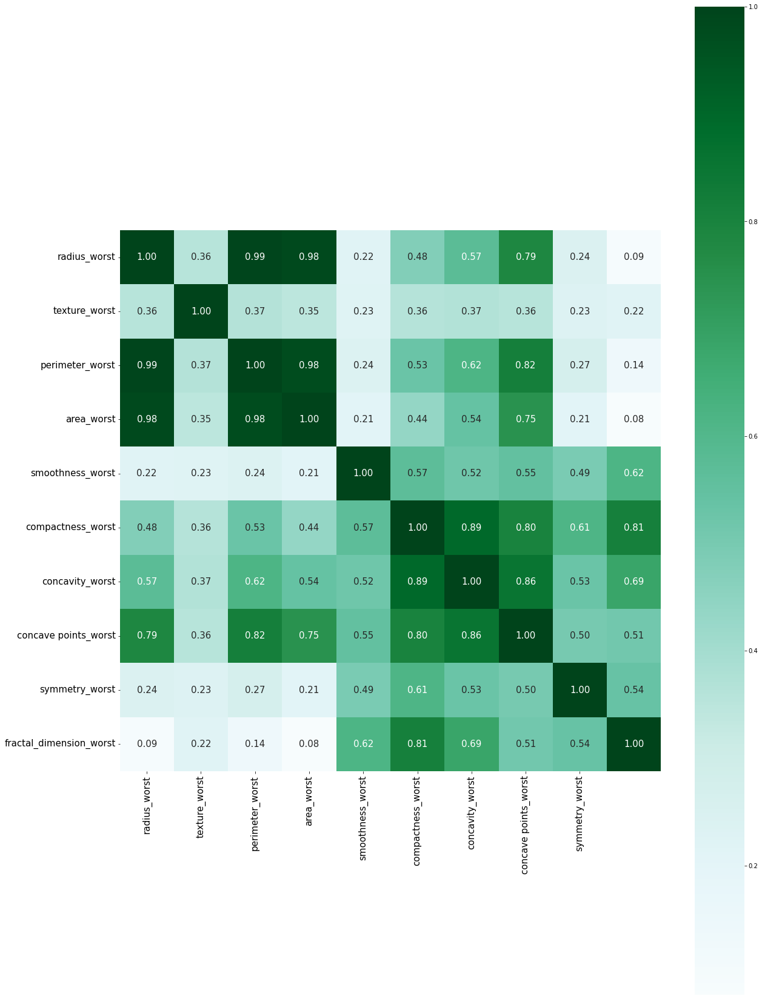

In [23]:
corr = x[features_worst].corr()
g = sns.heatmap(corr, cbar = True, annot=True, annot_kws={'size': 15}, fmt= '.2f', square = True, cmap = 'BuGn' )
g.set_xticklabels(      rotation=90, labels = features_worst, size = 15)
g.set_yticklabels(rotation=0, labels = features_worst, size = 15)
g.set_xticks(np.arange(.5,9.5,1))
plt.rcParams["figure.figsize"] = (20,30)

# Seperate data in two parts bengin and malignant

In [24]:
dfM=data[data['diagnosis'] ==1]   # 0 = Bengin   , 1 = Malignant
dfB=data[data['diagnosis'] ==0]

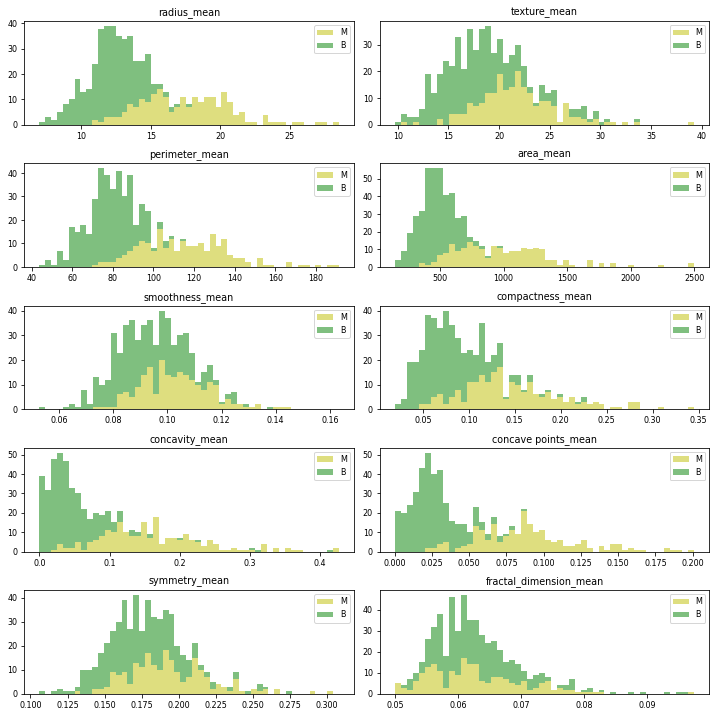

In [25]:
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,10))
axes = axes.ravel()
for i,ax in enumerate(axes):
    ax.figure
    binwidth= (max(data[features_mean[i]]) - min(data[features_mean[i]]))/50
    ax.hist([dfM[features_mean[i]],dfB[features_mean[i]]], bins=np.arange(min(data[features_mean[i]]), max(data[features_mean[i]]) + binwidth, binwidth) , alpha=0.5,stacked=True, label=['M','B'],color=['y','g'])
    ax.legend(loc='upper right')
    ax.set_title(features_mean[i])
plt.tight_layout()
plt.show()

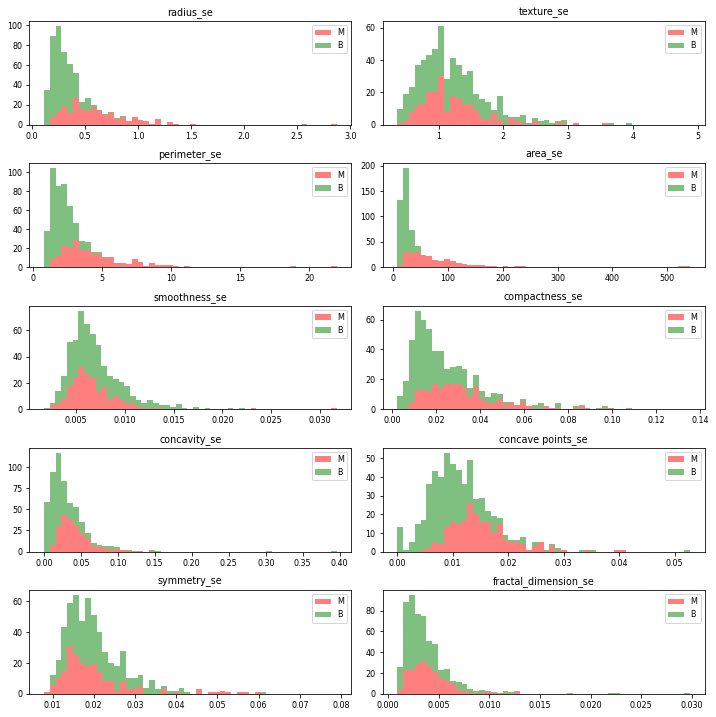

In [26]:
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,10))
axes = axes.ravel()
for i,ax in enumerate(axes):
    ax.figure
    binwidth= (max(data[features_se[i]]) - min(data[features_se[i]]))/50
    ax.hist([dfM[features_se[i]],dfB[features_se[i]]], bins=np.arange(min(data[features_se[i]]), max(data[features_se[i]]) + binwidth, binwidth) , alpha=0.5,stacked=True, label=['M','B'],color=['r','g'])
    ax.legend(loc='upper right')
    ax.set_title(features_se[i])
plt.tight_layout()
plt.show()

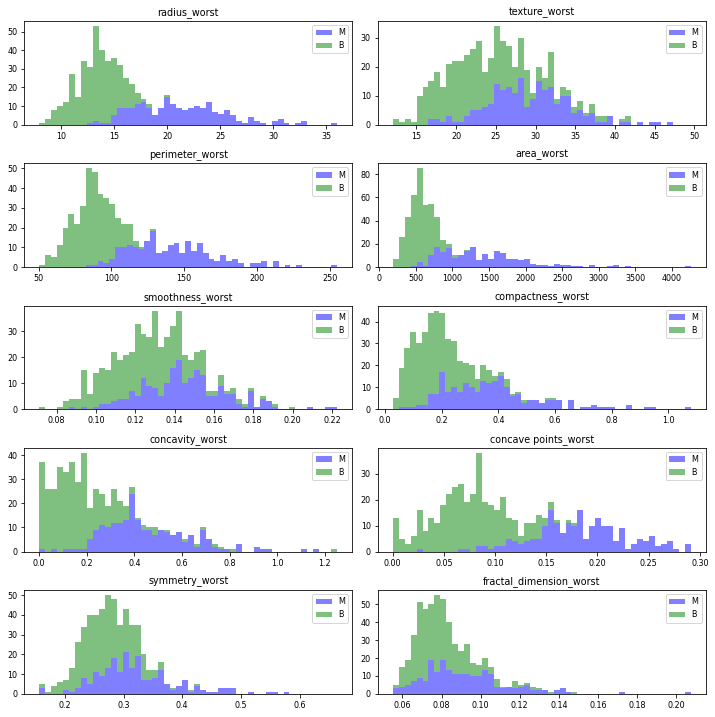

In [27]:
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,10))
axes = axes.ravel()
for i,ax in enumerate(axes):
    ax.figure
    binwidth= (max(data[features_worst[i]]) - min(data[features_worst[i]]))/50
    ax.hist([dfM[features_worst[i]],dfB[features_worst[i]]], bins=np.arange(min(data[features_worst[i]]), max(data[features_worst[i]]) + binwidth, binwidth) , alpha=0.5,stacked=True, label=['M','B'],color=['b','g'])
    ax.legend(loc='upper right')
    ax.set_title(features_worst[i])
plt.tight_layout()
plt.show()

<AxesSubplot:>

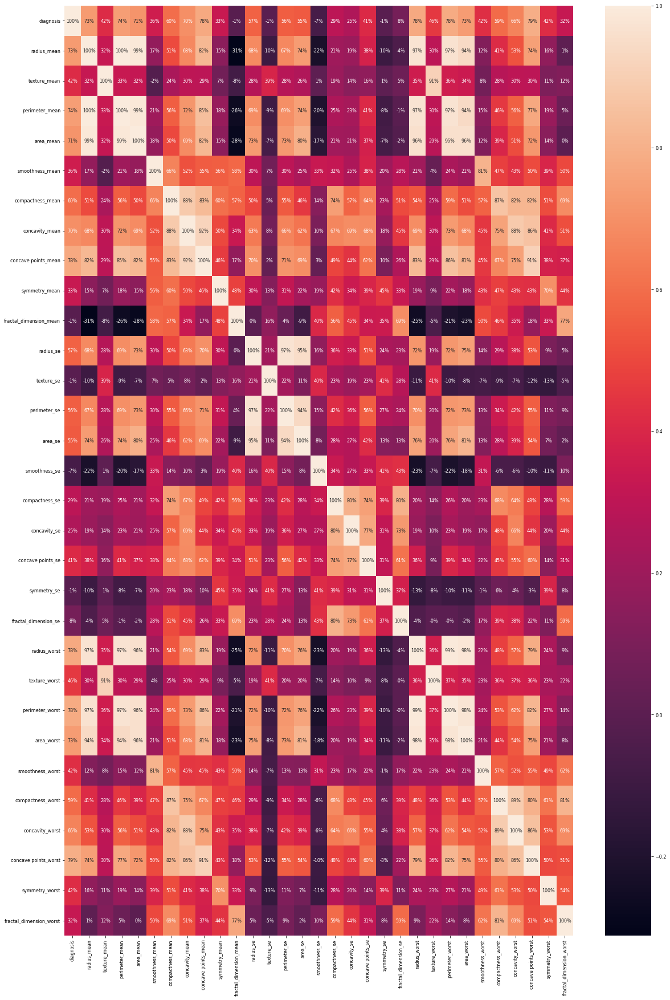

In [28]:
sns.heatmap(data.corr(),annot=True,fmt='.0%')

In [21]:
data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [22]:
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


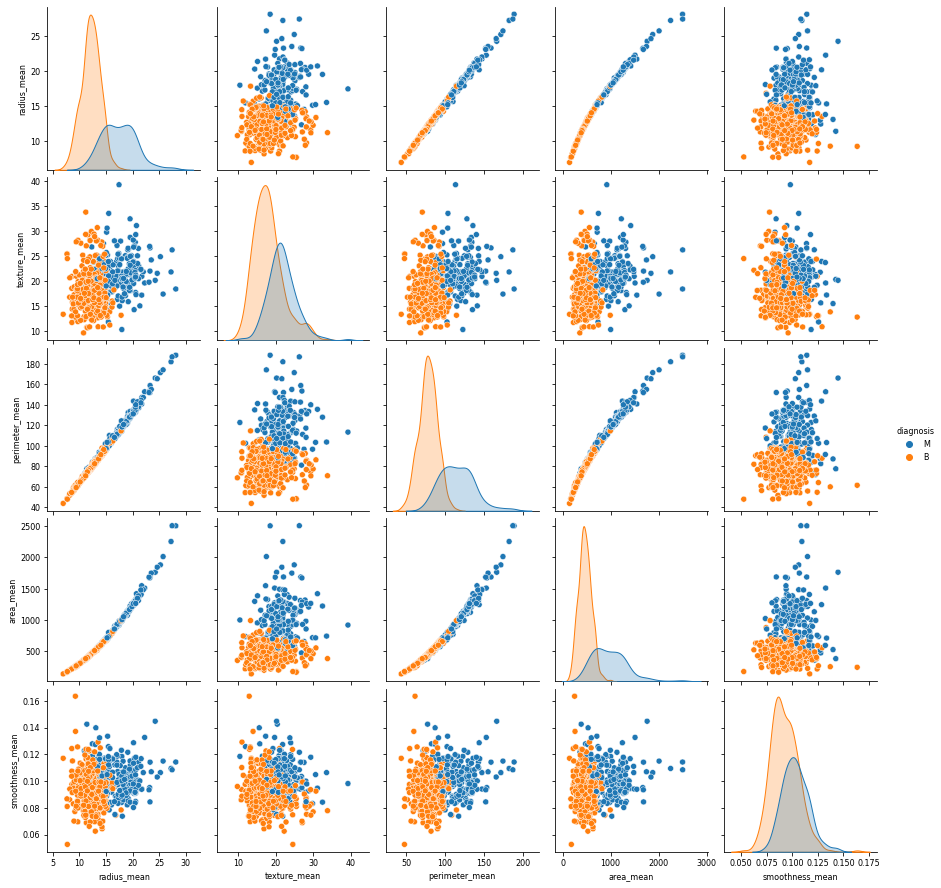

In [31]:
sns.pairplot(df.iloc[:,1:7],hue='diagnosis') #, hue='diagnosis'

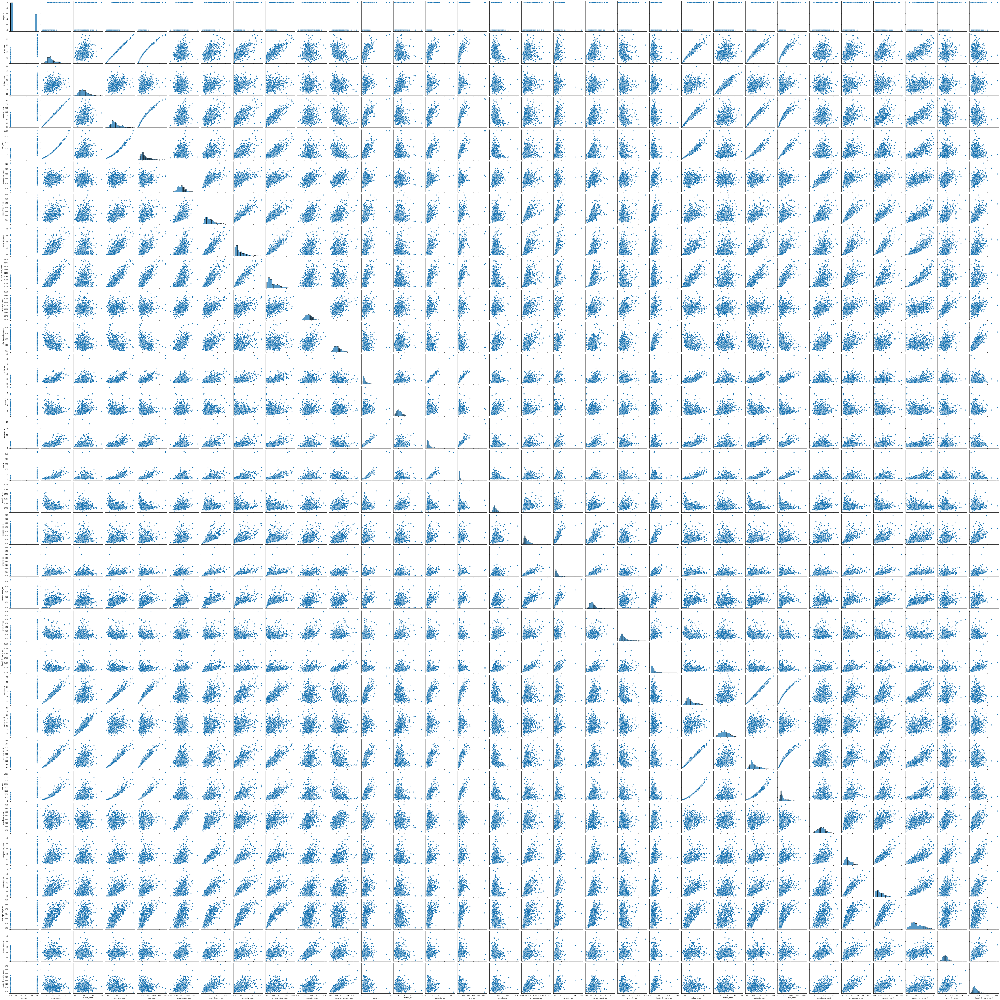

In [32]:
sns.pairplot( data)

# Model Training

In [23]:
data.shape

(569, 31)

In [24]:
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [25]:
data.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [26]:
#data.drop('id', axis = 1, inplace = True)

In [27]:
#data.drop('Unnamed: 32', axis = 1, inplace = True)

In [202]:
X = data.iloc[:,1:32].values
Y = data.iloc[:,0].values

In [203]:
data.shape

(569, 31)

In [204]:
Y.shape

(569,)

In [31]:
X.shape

(569, 30)

In [32]:
Y

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,

In [33]:
X

array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
        1.189e-01],
       [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
        8.902e-02],
       [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
        8.758e-02],
       ...,
       [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
        7.820e-02],
       [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
        1.240e-01],
       [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
        7.039e-02]])

In [34]:
import time
start = time.time()
print("Time elapsed on working...")
time.sleep(0.9)
end = time.time()
print("Time consumed in working: ",end - start)

Time elapsed on working...
Time consumed in working:  0.9012949466705322


In [35]:
start = time.time()
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25 , random_state = 0)
end = time.time()
print("Time consumed in working: ",end - start)

Time consumed in working:  0.016965627670288086


In [36]:
start = time.time()
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)
print("Time consumed time: ",end - start)

Time consumed time:  -0.7355153560638428


In [37]:
from contextlib import contextmanager

In [38]:
@contextmanager
def timer():
    """Helper for measuring runtime"""

    time0 =  time.perf_counter()
    
    yield
    print('[elapsed time: %.18f s]' % (time.perf_counter() - time0))

In [39]:
#support Vector Machine
from sklearn.svm import SVC
V = SVC()

In [40]:
import time
print("Model training time")
with timer() as t:
    V.fit(X_train,Y_train)

Model training time
[elapsed time: 0.004519399999992402 s]


In [41]:
with timer() as t:
    v = 2444444444444444444444*222222222222234

[elapsed time: 0.000001099999963117 s]


In [40]:
def models(X_train,Y_train):
    
    #Logistic Regression
    from sklearn.linear_model import LogisticRegression
    log = LogisticRegression(random_state=0)
    log.fit(X_train,Y_train)
    
    
    # Decision tree
    from sklearn.tree import DecisionTreeClassifier
    tree = DecisionTreeClassifier(criterion = 'entropy', random_state=0)
    tree.fit(X_train,Y_train)
    
    # Random Forest
    from sklearn.ensemble import RandomForestClassifier
    forest  = RandomForestClassifier(n_estimators=10,criterion = 'entropy', random_state=0)
    forest.fit(X_train,Y_train)
    
    # KNN
    from sklearn.neighbors import KNeighborsClassifier
    knn = KNeighborsClassifier()
    knn.fit(X_train,Y_train)
    
    #LDA
    from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
    lda = LinearDiscriminantAnalysis()
    lda.fit(X_train,Y_train)
    
    # Bagging
    from sklearn.ensemble import BaggingClassifier
    bgg = BaggingClassifier()
    bgg.fit(X_train,Y_train)
    
    # adaboost
    from sklearn.ensemble import AdaBoostClassifier
    ada = AdaBoostClassifier()
    ada.fit(X_train,Y_train)
    
    #Gradient boost
    from sklearn.ensemble import GradientBoostingClassifier
    grd = GradientBoostingClassifier()
    grd.fit(X_train, Y_train)
    
    # ExtraTreesClassifier
    from sklearn.ensemble import ExtraTreesClassifier
    ext = ExtraTreesClassifier()
    ext.fit(X_train,Y_train)
    
    # Naive Bayes
    from sklearn.naive_bayes import GaussianNB
    Gau = GaussianNB()
    Gau.fit(X_train,Y_train)
    
    # support Vector Machine
    from sklearn.svm import SVC
    V = SVC()
    V.fit(X_train,Y_train)
    


  
    
    #Print the  model accuracy on the training data
    print("[0] Logistic Regression Training Accuracy :", log.score(X_train,Y_train))
    print("[1] Decision Tree Training Acuuracy :", tree.score(X_train,Y_train))
    print("[2] Random Forest Training Accuracy :", forest.score(X_train,Y_train))
    print("[3] KNN Training Accuracy :", knn.score(X_train,Y_train))
    print("[4] LDA Training Accuracy :", lda.score(X_train,Y_train))
    
    print("[5] Bagging Training Accuracy :", bgg.score(X_train,Y_train))
    print("[6] adaboost Training Accuracy :", ada.score(X_train,Y_train))
    print("[7] Gradient Training Accuracy :", grd.score(X_train,Y_train))
    print("[8] ExtraTreesClassifier Training Accuracy :", ext.score(X_train,Y_train))
    
    print("[9]  GaussianNB Training Accuracy :", Gau.score(X_train,Y_train))
    print("[10] Support Vector Machine Training Accuracy :", V.score(X_train,Y_train))
    
    
    return  log, tree, forest, knn, lda, bgg, ada, grd,ext,Gau,V

    

In [41]:
model = models(X_train,Y_train)

[0] Logistic Regression Training Accuracy : 0.9906103286384976
[1] Decision Tree Training Acuuracy : 1.0
[2] Random Forest Training Accuracy : 0.9976525821596244
[3] KNN Training Accuracy : 0.9741784037558685
[4] LDA Training Accuracy : 0.9624413145539906
[5] Bagging Training Accuracy : 1.0
[6] adaboost Training Accuracy : 1.0
[7] Gradient Training Accuracy : 1.0
[8] ExtraTreesClassifier Training Accuracy : 1.0
[9]  GaussianNB Training Accuracy : 0.9483568075117371
[10] Support Vector Machine Training Accuracy : 0.9859154929577465


#### Test the accuracy of the model on the Testing data using Confusion Matrix

<img src="confusionMatrix.PNG">

In [42]:
from sklearn.metrics import confusion_matrix
for i in range(len(model)):
    print("Model",i)
    cm = confusion_matrix(Y_test,model[i].predict(X_test))
    
    TP = cm[1][1]
    TN = cm[0][0]
    FN = cm[0][1]
    FP = cm[1][0]
    
    print(cm)
    print("Testing Accuracy = ",(TP + TN)/(TP + TN + FN + FP))
    print()
    

Model 0
[[86  4]
 [ 2 51]]
Testing Accuracy =  0.958041958041958

Model 1
[[85  5]
 [ 3 50]]
Testing Accuracy =  0.9440559440559441

Model 2
[[88  2]
 [ 1 52]]
Testing Accuracy =  0.9790209790209791

Model 3
[[89  1]
 [ 6 47]]
Testing Accuracy =  0.951048951048951

Model 4
[[90  0]
 [ 6 47]]
Testing Accuracy =  0.958041958041958

Model 5
[[86  4]
 [ 3 50]]
Testing Accuracy =  0.951048951048951

Model 6
[[86  4]
 [ 3 50]]
Testing Accuracy =  0.951048951048951

Model 7
[[86  4]
 [ 0 53]]
Testing Accuracy =  0.972027972027972

Model 8
[[87  3]
 [ 3 50]]
Testing Accuracy =  0.958041958041958

Model 9
[[86  4]
 [ 5 48]]
Testing Accuracy =  0.9370629370629371

Model 10
[[88  2]
 [ 3 50]]
Testing Accuracy =  0.965034965034965



In [71]:
precision = 88/(88+2)  # TP / TP + FP
precision

0.9777777777777777

In [72]:
Recall =  88/(88+3)  # TP / TP + FN
Recall

0.967032967032967

# Print the Classification Report

In [43]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

for i in range(len(model)):
    
    print("Model",i)
    print(classification_report(Y_test,model[0].predict(X_test)))
    print("Accuracy Score --> {}".format(accuracy_score(Y_test,model[0].predict(X_test))))
    print()


Model 0
              precision    recall  f1-score   support

           0       0.98      0.96      0.97        90
           1       0.93      0.96      0.94        53

    accuracy                           0.96       143
   macro avg       0.95      0.96      0.96       143
weighted avg       0.96      0.96      0.96       143

Accuracy Score --> 0.958041958041958

Model 1
              precision    recall  f1-score   support

           0       0.98      0.96      0.97        90
           1       0.93      0.96      0.94        53

    accuracy                           0.96       143
   macro avg       0.95      0.96      0.96       143
weighted avg       0.96      0.96      0.96       143

Accuracy Score --> 0.958041958041958

Model 2
              precision    recall  f1-score   support

           0       0.98      0.96      0.97        90
           1       0.93      0.96      0.94        53

    accuracy                           0.96       143
   macro avg       0.95     

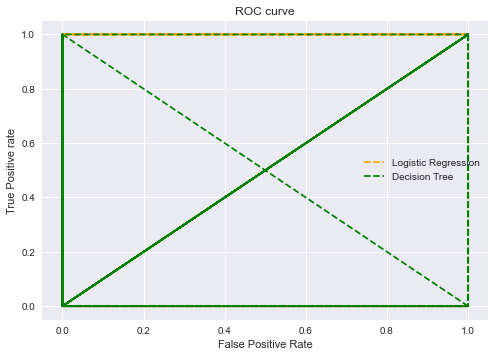

In [44]:
# matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')

# plot roc curves
plt.plot(Y_test,model[0].predict(X_test), linestyle='--',color='orange', label='Logistic Regression')
plt.plot(Y_test,model[1].predict(X_test), linestyle='--',color='green', label='Decision Tree')
# plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

# HYPER PARAMETER TUNING

In [66]:
# Define parameters for optimization using dictionaries {parameter name: parameter list}

SVM_params = {'C':[0.001, 0.1, 10, 100], 'kernel':['rbf' ,'linear', 'poly', 'sigmoid']}
LR_params = {'C':[0.001, 0.1, 1, 10, 100]}
LDA_params = {'n_components':[None, 1,2,3], 'solver':['svd'], 'shrinkage':[None]}
KNN_params = {'n_neighbors':[1,5,10,20, 50], 'p':[2], 'metric':['minkowski']}
RF_params = {'n_estimators':[10,50,100]}
DTC_params = {'criterion':['entropy', 'gini'], 'max_depth':[10, 50, 100]}

In [67]:
# Append list of models with parameter dictionaries

models_opt = []

models_opt.append(('LR', LogisticRegression(), LR_params))
models_opt.append(('LDA', LinearDiscriminantAnalysis(), LDA_params))
models_opt.append(('KNN', KNeighborsClassifier(),KNN_params))
models_opt.append(('DTC', DecisionTreeClassifier(), DTC_params))
models_opt.append(('RFC', RandomForestClassifier(), RF_params))
models_opt.append(('SVM', SVC(), SVM_params))

In [68]:
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
# sklearn.cross_validation.KFold(n=4, n_folds=2, shuffle=False,
#                                random_state=None)
from sklearn.model_selection import StratifiedKFold
#skfold=StratifiedKFold(n_splits=5)

In [69]:
results = []
names = []


def estimator_function(parameter_dictionary, scoring = 'accuracy'):
    
    
    for name, model, params in models_opt:
    
        #kfold = KFold(len(X_train_norm), n_folds=5, random_state=2, shuffle=True)
        #skfold=StratifiedKFold(n_splits=5)
        leave_validation=LeaveOneOut()

        model_grid = GridSearchCV(model, params)

        cv_results = cross_val_score(model_grid, X_train, Y_train, cv =leave_validation, scoring=scoring)

        results.append(cv_results)

        names.append(name)

        msg = "Cross Validation Accuracy %s: Accarcy: %f SD: %f" % (name, cv_results.mean(), cv_results.std())

        print(msg)

In [70]:
estimator_function(models_opt, scoring = 'accuracy')

Cross Validation Accuracy LR: Accarcy: 0.981221 SD: 0.135745
Cross Validation Accuracy LDA: Accarcy: 0.957746 SD: 0.201167
Cross Validation Accuracy KNN: Accarcy: 0.967136 SD: 0.178280
Cross Validation Accuracy DTC: Accarcy: 0.924883 SD: 0.263581
Cross Validation Accuracy RFC: Accarcy: 0.955399 SD: 0.206426
Cross Validation Accuracy SVM: Accarcy: 0.981221 SD: 0.135745


In [ ]:
SVM : Accarcy: 0.981221 SD: 0.135745

# Random Forest

### The main parameters used by a Random Forest Classifier are:

criterion = the function used to evaluate the quality of a split.\
max_depth = maximum number of levels allowed in each tree.\
max_features = maximum number of features considered when splitting a node.\
min_samples_leaf = minimum number of samples which can be stored in a tree leaf.\
min_samples_split = minimum number of samples necessary in a node to cause node splitting.\
n_estimators = number of trees in the ensamble

In [42]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [43]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(X_train,Y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=100, verbose=2)

In [143]:
rf_randomcv.best_params_
# {'n_estimators': 1400,
#  'min_samples_split': 2,
#  'min_samples_leaf': 1,
#  'max_features': 'sqrt',
#  'max_depth': 120,
#  'criterion': 'entropy'}

{'n_estimators': 200,
 'min_samples_split': 10,
 'min_samples_leaf': 6,
 'max_features': 'auto',
 'max_depth': 230,
 'criterion': 'entropy'}

In [144]:
best_random_grid=rf_randomcv.best_estimator_

In [46]:
from sklearn.metrics import accuracy_score
y_pred=best_random_grid.predict(X_test)
print(confusion_matrix(Y_test,y_pred))
print("Training Accuracy Score {}".format(best_random_grid.score(X_train,Y_train)))
print("Testing Accuracy Score {}".format(accuracy_score(Y_test,y_pred)))
print("Classification report: {}".format(classification_report(Y_test,y_pred)))

[[88  2]
 [ 1 52]]
Training Accuracy Score 0.9882629107981221
Testing Accuracy Score 0.9790209790209791
Classification report:               precision    recall  f1-score   support

           0       0.99      0.98      0.98        90
           1       0.96      0.98      0.97        53

    accuracy                           0.98       143
   macro avg       0.98      0.98      0.98       143
weighted avg       0.98      0.98      0.98       143



# ROC RF

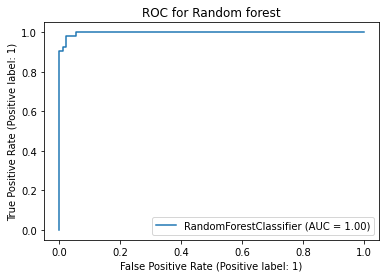

In [191]:
import matplotlib.pyplot as plt
from sklearn import  metrics, model_selection, svm
metrics.plot_roc_curve(best_random_grid, X_test, Y_test) 
plt.title("ROC for Random forest")
plt.show()

In [180]:
pred_prob=rf_randomcv.predict_proba(X_test)

In [181]:
classes = np.unique(Y_test)
classes

array([0, 1], dtype=int64)

In [184]:
len(classes)

2

In [185]:
n_class = classes.shape[0]
n_class

2

In [186]:
y_test_binarized=label_binarize(Y_test,classes=np.unique(Y_test))
y_test_binarized

array([[1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [1],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
    

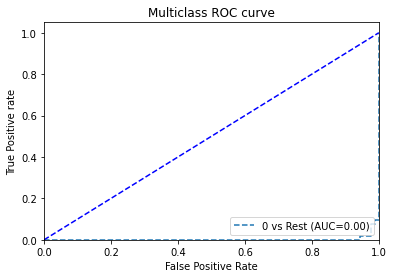

In [188]:
from sklearn.preprocessing import label_binarize
#binarize the y_values

y_test_binarized=label_binarize(Y_test,classes=np.unique(Y_test))

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()

n_class = classes.shape[0]

for i in range(1):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    
    # plotting    
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

In [71]:
TP = 88
FN = 2
FP = 1
TN = 52

In [98]:
# Random forest
def fun(TP,FN,FP,TN):
    print("Random Forest on BCWD")
    print("TP",TP)
    print("FN",FN)
    print("FP",FP)
    print("TN", TN)
    Accuracy = (TP + TN)/(TP + TN + FP + FN)
    print("Accuracy : {}".format(Accuracy))
    Precision = TP / (TP + FP)
    print("Precision : {}".format(Precision))
    Recall = TP / (TP + FN)
    print("Recall : {} ".format(Recall))
    F1_score = 2*(Precision*Recall)/(Precision + Recall)
    print("F1_score : {}".format(F1_score))
    TPR = TP / (TP + FP)
    print("TPR : {}".format(TPR))
    FPR = FP / (FP + TN)
    print("FPR : {}".format(FPR))

In [99]:
fun(TP,FN,FP,TN)

Random Forest on BCWD
TP 88
FN 2
FP 1
TN 52
Accuracy : 0.9790209790209791
Precision : 0.9887640449438202
Recall : 0.9777777777777777 
F1_score : 0.9832402234636872
TPR : 0.9887640449438202
FPR : 0.018867924528301886


In [102]:
0.018867924528301886*100

1.8867924528301887

In [74]:
TPR = TP/ (TP + FP)
TPR

0.9887640449438202

In [75]:
FPR = FP/ (FP + TN)
FPR

0.018867924528301886

In [77]:
accuracy  = (88 + 52)/(88+52 + 1 + 2)
accuracy

0.9790209790209791

In [78]:
error =  1 - 0.9790209790209791
error

0.020979020979020935

In [72]:
precision = TP /(TP + FP)
precision

0.9887640449438202

In [73]:
(0.99 + 0.96 ) /2

0.975

# GridSearchCV

In [47]:
rf_randomcv.best_params_

{'n_estimators': 200,
 'min_samples_split': 10,
 'min_samples_leaf': 6,
 'max_features': 'auto',
 'max_depth': 230,
 'criterion': 'entropy'}

In [48]:
 from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['entropy'], 'max_depth': [230], 'max_features': ['auto'], 'min_samples_leaf': [6, 8, 10], 'min_samples_split': [8, 9, 10, 11, 12], 'n_estimators': [0, 100, 200, 300, 400]}


In [49]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(X_train,Y_train)

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [230],
                         'max_features': ['auto'],
                         'min_samples_leaf': [6, 8, 10],
                         'min_samples_split': [8, 9, 10, 11, 12],
                         'n_estimators': [0, 100, 200, 300, 400]},
             verbose=2)

In [50]:
grid_search.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=230, max_features='auto',
                       min_samples_leaf=6, min_samples_split=12)

In [51]:
best_grid=grid_search.best_estimator_

In [52]:
best_grid

RandomForestClassifier(criterion='entropy', max_depth=230, max_features='auto',
                       min_samples_leaf=6, min_samples_split=12)

In [53]:
best_grid=grid_search.best_estimator_
y_pred=best_grid.predict(X_test)
print(confusion_matrix(Y_test,y_pred))
print("Training Accuracy Score {}".format(best_grid.score(X_train,Y_train)))
print("Testing Accuracy Score {}".format(accuracy_score(Y_test,y_pred)))
print("Classification report: {}".format(classification_report(Y_test,y_pred)))

[[88  2]
 [ 1 52]]
Training Accuracy Score 0.9835680751173709
Testing Accuracy Score 0.9790209790209791
Classification report:               precision    recall  f1-score   support

           0       0.99      0.98      0.98        90
           1       0.96      0.98      0.97        53

    accuracy                           0.98       143
   macro avg       0.98      0.98      0.98       143
weighted avg       0.98      0.98      0.98       143



# StratifiedKFold

In [58]:
from sklearn.model_selection import StratifiedKFold

In [65]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=skfold,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(X_train,Y_train)

NameError: name 'skfold' is not defined

In [ ]:
rf_randomcv.best_params_
# {'n_estimators': 2000,
#  'min_samples_split': 5,
#  'min_samples_leaf': 1,
#  'max_features': 'log2',
#  'max_depth': 560,
#  'criterion': 'entropy'}

In [ ]:
best_random_grid=rf_randomcv.best_estimator_

In [ ]:
from sklearn.metrics import accuracy_score
y_pred=best_random_grid.predict(X_test)
print(confusion_matrix(Y_test,y_pred))
print("Training Accuracy Score {}".format(best_random_grid.score(X_train,Y_train)))
print("Testing Accuracy Score {}".format(accuracy_score(Y_test,y_pred)))
print("Classification report: {}".format(classification_report(Y_test,y_pred)))

# SVM

In [138]:
from sklearn.metrics import classification_report # make predictions on validation datasets
with timer() as t:
    SVM = SVC(C=1.0,
    kernel='rbf',
    degree=6,
    gamma='scale',
    coef0=0.0,
    shrinking=True,
    probability=False,
    tol=0.001,
    cache_size=300,
    class_weight=None,
    verbose=False,
    max_iter=-1,
    decision_function_shape='ovr',
    break_ties=False,
    random_state=None)
    
    SVM.fit(X_train, Y_train)
    predictions= SVM.predict(X_test)
    print(("training score : {}").format(SVM.score(X_train, Y_train)))
    print(("testing score : {}").format(accuracy_score(Y_test, predictions)))
    print(classification_report(Y_test, predictions))
    print(confusion_matrix(Y_test, predictions))

training score : 0.9859154929577465
testing score : 0.965034965034965
              precision    recall  f1-score   support

           0       0.97      0.98      0.97        90
           1       0.96      0.94      0.95        53

    accuracy                           0.97       143
   macro avg       0.96      0.96      0.96       143
weighted avg       0.96      0.97      0.96       143

[[88  2]
 [ 3 50]]
[elapsed time: 0.079899300006218255 s]


In [ ]:
training score : 0.9859154929577465
testing score : 0.965034965034965
              precision    recall  f1-score   support

           0       0.97      0.98      0.97        90
           1       0.96      0.94      0.95        53

    accuracy                           0.97       143
   macro avg       0.96      0.96      0.96       143
weighted avg       0.96      0.97      0.96       143

[[88  2]
 [ 3 50]]
[elapsed time: 0.193647000000055414 s]

# ROC  SVM

In [139]:
y_pred_svm = SVM.decision_function(X_test)

In [140]:
y_pred_svm

array([ 1.70116818, -1.12780581, -1.83841237, -1.17513428, -1.95205075,
       -1.90500947, -2.00024234, -1.82985053, -1.42371522, -1.85222515,
       -0.18959183, -0.95772951, -2.23797921,  0.10404572, -0.30147165,
        0.85967304, -0.97023521,  2.09538255,  1.45860451,  1.50637731,
        1.36267544,  1.25655747, -1.62484822, -2.15569583,  1.46504685,
       -1.95907997, -1.81725754,  1.25205967, -1.7788993 ,  2.50045688,
       -1.91671145,  1.79683012, -0.79259367,  1.82973994, -1.77698993,
        1.71266761, -1.47897821,  1.96029441, -1.53073556,  1.9278149 ,
        0.50550417, -1.91030533,  0.60477168, -2.22171477, -0.54791687,
        1.15717663, -1.8239415 , -1.41715862, -1.85998542,  1.98069664,
        0.40037742,  0.84925134,  2.64149732, -1.87965259, -2.02479458,
       -2.0009459 , -1.41487978, -1.20320133, -1.5417216 ,  1.26138294,
        1.2278229 ,  1.82944696, -1.90770512, -1.61031975,  0.94460967,
       -0.90416834,  0.68449274,  1.78202226,  1.8947601 , -1.92

In [159]:
y_pred_RF=rf_randomcv.predict_proba(X_test)
y_pred_RF = y_pred_RF.reshape((1,286))
y_pred_RF.shape

(1, 286)

In [160]:
143*2, y_pred_RF.ndim

(286, 2)

In [149]:
Y_test.ndim

1

In [151]:
y_pred_RF.ndim, y_pred_svm.ndim

(2, 1)

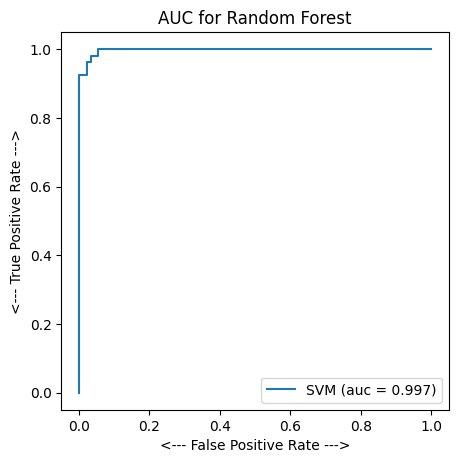

In [193]:
from sklearn.metrics import roc_curve, auc

# RF_fpr, RF_tpr, threshold = roc_curve(Y_test, y_pred_RF.reshape((1,286)))
# auc_RF = auc(RF_fpr, RF_tpr)

svm_fpr, svm_tpr, threshold = roc_curve(Y_test, y_pred_svm)
auc_svm = auc(svm_fpr, svm_tpr)

plt.figure(figsize=(5, 5), dpi=100)
plt.plot(svm_fpr, svm_tpr, linestyle='-', label='SVM (auc = %0.3f)' % auc_svm)
# plt.plot(RF_fpr, RF_tpr, marker='.', label='Random Forerst (auc = %0.3f)' % auc_RF)

plt.xlabel('<--- False Positive Rate --->')
plt.ylabel('<--- True Positive Rate --->')
plt.title("AUC for Random Forest")
plt.legend()

plt.show()

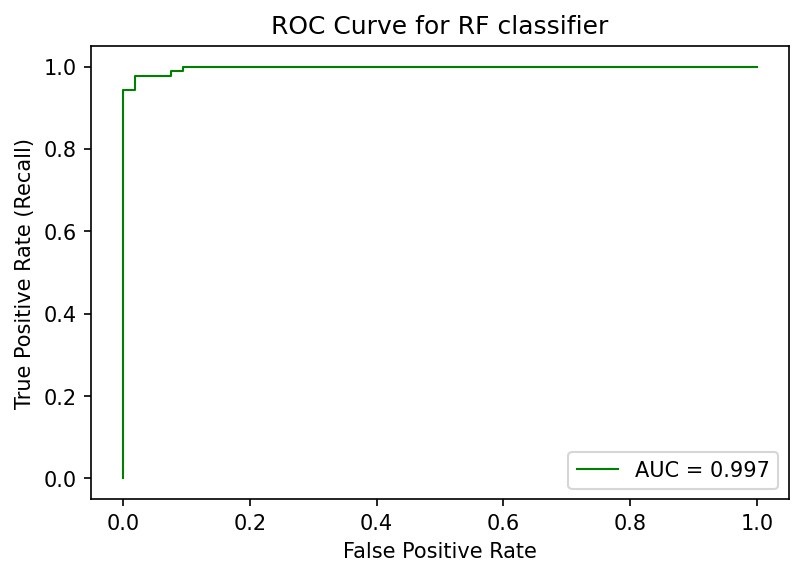

In [195]:
probas = y_pred_RF.copy()
from sklearn.metrics import roc_curve, auc
# get false and true positive rates
fpr, tpr, thresholds = roc_curve(Y_test, probas[:,0], pos_label=0)
# get area under the curve
roc_auc = auc(fpr, tpr)
# PLOT ROC curve
plt.figure(dpi=150)
plt.plot(fpr, tpr, lw=1, color='green', label=f'AUC = {roc_auc:.3f}')
plt.title('ROC Curve for RF classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall)')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.legend()
plt.show()

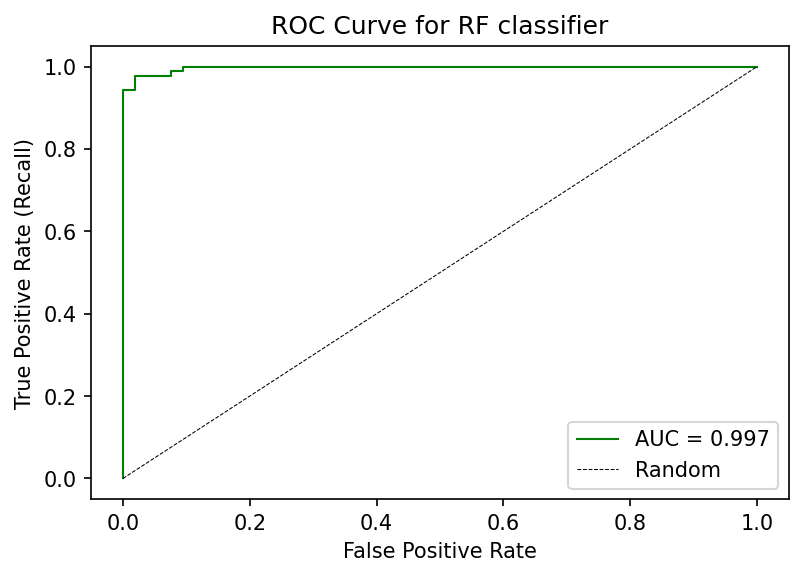

In [198]:
""" Straightforward ROC curve """

# get false and true positive rates
fpr, tpr, _ = roc_curve(Y_test, probas[:,0], pos_label=0)

# get area under the curve
roc_auc = auc(fpr, tpr)

# PLOT ROC curve
plt.figure(dpi=150)
plt.plot(fpr, tpr, lw=1, color='green', label=f'AUC = {roc_auc:.3f}')
plt.plot([0,1], [0,1], '--k', lw=0.5, label='Random')
plt.title('ROC Curve for RF classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall)')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.legend()
plt.show()

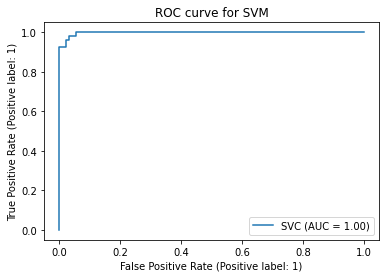

In [196]:
import matplotlib.pyplot as plt
from sklearn import  metrics, model_selection, svm
metrics.plot_roc_curve(SVM, X_test, Y_test) 
plt.title("ROC curve for SVM")
plt.show()

In [89]:
TP1 = 88
TN1 = 50
FP1 = 3
FN1 =  2

In [91]:
(88+50)/(88+50+5)

0.965034965034965

In [96]:
#
TP1 = 88
TN1 = 50
FP1 = 3
FN1 =  2
fun1(TP1,FN1,FP1,TN1)
def fun1(TP,FN,FP,TN):
    
    print("SVM on BCWD ---------------------->")
    print("TP",TP)
    print("FN",FN)
    print("FP",FP)
    print("TN", TN)
    Accuracy = (TP + TN)/(TP + TN + FP + FN)
    print("Accuracy : {}".format(Accuracy))
    Precision = TP / (TP + FP)
    print("Precision : {}".format(Precision))
    Recall = TP / (TP + FN)
    print("Recall : {} ".format(Recall))
    F1_score = 2*(Precision*Recall)/(Precision + Recall)
    print("F1_score : {}".format(F1_score))
    TPR = TP / (TP + FP)
    print("TPR : {}".format(TPR))
    FPR = FP / (FP + TN)
    print("FPR : {}".format(FPR))

In [97]:
fun1(TP1,FN1,FP1,TN1)

SVM on BCWD ---------------------->
TP 88
FN 2
FP 3
TN 50
Accuracy : 0.965034965034965
Precision : 0.967032967032967
Recall : 0.9777777777777777 
F1_score : 0.9723756906077348
TPR : 0.967032967032967
FPR : 0.05660377358490566


In [100]:
0.05660377358490566*100

5.660377358490567

In [101]:
5.660377358490567/100

0.05660377358490567

# Model Training after feature selection

In [106]:
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [108]:
DF = data[['radius_mean', 'perimeter_mean', 
'area_mean',   'concave points_mean',
'radius_worst', 'perimeter_worst',
'area_worst', 'concave points_worst','diagnosis']]


In [109]:
DF

,radius_mean,perimeter_mean,area_mean,concave points_mean,radius_worst,perimeter_worst,area_worst,concave points_worst,diagnosis
0,17.99,122.80,1001.0,0.14710,25.380,184.60,2019.0,0.2654,1
1,20.57,132.90,1326.0,0.07017,24.990,158.80,1956.0,0.1860,1
2,19.69,130.00,1203.0,0.12790,23.570,152.50,1709.0,0.2430,1
3,11.42,77.58,386.1,0.10520,14.910,98.87,567.7,0.2575,1
4,20.29,135.10,1297.0,0.10430,22.540,152.20,1575.0,0.1625,1
...,...,...,...,...,...,...,...,...,...
564,21.56,142.00,1479.0,0.13890,25.450,166.10,2027.0,0.2216,1
565,20.13,131.20,1261.0,0.09791,23.690,155.00,1731.0,0.1628,1
566,16.60,108.30,858.1,0.05302,18.980,126.70,1124.0,0.1418,1
567,20.60,140.10,1265.0,0.15200,25.740,184.60,1821.0,0.2650,1


In [110]:
data.shape

(569, 31)

In [119]:
X1 = DF.iloc[:,0:8] #.values
Y1 = DF.iloc[:,8] #.values

In [122]:
X1

,radius_mean,perimeter_mean,area_mean,concave points_mean,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,122.80,1001.0,0.14710,25.380,184.60,2019.0,0.2654
1,20.57,132.90,1326.0,0.07017,24.990,158.80,1956.0,0.1860
2,19.69,130.00,1203.0,0.12790,23.570,152.50,1709.0,0.2430
3,11.42,77.58,386.1,0.10520,14.910,98.87,567.7,0.2575
4,20.29,135.10,1297.0,0.10430,22.540,152.20,1575.0,0.1625
...,...,...,...,...,...,...,...,...
564,21.56,142.00,1479.0,0.13890,25.450,166.10,2027.0,0.2216
565,20.13,131.20,1261.0,0.09791,23.690,155.00,1731.0,0.1628
566,16.60,108.30,858.1,0.05302,18.980,126.70,1124.0,0.1418
567,20.60,140.10,1265.0,0.15200,25.740,184.60,1821.0,0.2650


In [120]:
X1.shape

(569, 8)

In [121]:
Y1

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

In [123]:
start = time.time()
from sklearn.model_selection import train_test_split
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(X1, Y1, test_size = 0.25 , random_state = 0)
end = time.time()
print("Time consumed in working: ",end - start)

Time consumed in working:  0.001998424530029297


In [124]:
X_train1

,radius_mean,perimeter_mean,area_mean,concave points_mean,radius_worst,perimeter_worst,area_worst,concave points_worst
293,11.850,75.54,432.7,0.022800,13.060,84.35,517.8,0.09140
332,11.220,71.94,387.3,0.007583,11.980,76.91,436.1,0.02022
565,20.130,131.20,1261.0,0.097910,23.690,155.00,1731.0,0.16280
278,13.590,86.24,572.3,0.012380,15.500,98.91,739.1,0.05185
489,16.690,107.10,857.6,0.023070,19.180,127.30,1084.0,0.08737
...,...,...,...,...,...,...,...,...
277,18.810,120.90,1102.0,0.058430,19.960,129.00,1236.0,0.12940
9,12.460,83.97,475.9,0.085430,15.090,97.65,711.4,0.22100
359,9.436,59.82,278.6,0.014060,12.020,75.79,439.6,0.05052
192,9.720,60.73,288.1,0.000000,9.968,62.25,303.8,0.00000


In [125]:
rf1=RandomForestClassifier()
rf_randomcv1=RandomizedSearchCV(estimator=rf1,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv1.fit(X_train1,Y_train1)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=100, verbose=2)

In [127]:
#### Fit the grid_search to the data
rf1=RandomForestClassifier()
grid_search1=GridSearchCV(estimator=rf1,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search1.fit(X_train1,Y_train1)

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [230],
                         'max_features': ['auto'],
                         'min_samples_leaf': [6, 8, 10],
                         'min_samples_split': [8, 9, 10, 11, 12],
                         'n_estimators': [0, 100, 200, 300, 400]},
             verbose=2)

In [129]:
best_grid1=grid_search1.best_estimator_
y_pred1=best_grid1.predict(X_test1)
print(confusion_matrix(Y_test1,y_pred1))
print("Training Accuracy Score {}".format(best_grid1.score(X_train1,Y_train1)))
print("Testing Accuracy Score {}".format(accuracy_score(Y_test1,y_pred1)))
print("Classification report: {}".format(classification_report(Y_test1,y_pred1)))

[[88  2]
 [ 3 50]]
Training Accuracy Score 0.9694835680751174
Testing Accuracy Score 0.965034965034965
Classification report:               precision    recall  f1-score   support

           0       0.97      0.98      0.97        90
           1       0.96      0.94      0.95        53

    accuracy                           0.97       143
   macro avg       0.96      0.96      0.96       143
weighted avg       0.96      0.97      0.96       143



In [136]:
# after feature selections
TP1 = 88
TN1 = 50
FP1 = 3
FN1 =  2

def fun11(TP,FN,FP,TN):
    
    print("Random Forest after feature selections on BCWD ---------------------->")
    print("TP",TP)
    print("FN",FN)
    print("FP",FP)
    print("TN", TN)
    Accuracy = (TP + TN)/(TP + TN + FP + FN)
    print("Accuracy : {}".format(Accuracy))
    Precision = TP / (TP + FP)
    print("Precision : {}".format(Precision))
    Recall = TP / (TP + FN)
    print("Recall : {} ".format(Recall))
    F1_score = 2*(Precision*Recall)/(Precision + Recall)
    print("F1_score : {}".format(F1_score))
    TPR = TP / (TP + FP)
    print("TPR : {}".format(TPR))
    FPR = FP / (FP + TN)
    print("FPR : {}".format(FPR))
    
    
fun11(TP1,FN1,FP1,TN1)

Random Forest after feature selections on BCWD ---------------------->
TP 88
FN 2
FP 3
TN 50
Accuracy : 0.965034965034965
Precision : 0.967032967032967
Recall : 0.9777777777777777 
F1_score : 0.9723756906077348
TPR : 0.967032967032967
FPR : 0.05660377358490566


# SVM after feature selections

In [133]:
from sklearn.metrics import classification_report # make predictions on validation datasets
with timer() as t:
    SVM = SVC()
    SVM.fit(X_train1, Y_train1)
    predictions= SVM.predict(X_test1)
    print(("training score : {}").format(SVM.score(X_train1, Y_train1)))
    print(("testing score : {}").format(accuracy_score(Y_test1, predictions)))
    print(classification_report(Y_test1, predictions))
    print(confusion_matrix(Y_test1, predictions))

training score : 0.9107981220657277
testing score : 0.9370629370629371
              precision    recall  f1-score   support

           0       0.93      0.98      0.95        90
           1       0.96      0.87      0.91        53

    accuracy                           0.94       143
   macro avg       0.94      0.92      0.93       143
weighted avg       0.94      0.94      0.94       143

[[88  2]
 [ 7 46]]
[elapsed time: 0.047991100000217557 s]


In [135]:
# after feature selections
TP1 = 88
TN1 = 46
FP1 = 7
FN1 =  2

def fun11(TP,FN,FP,TN):
    
    print("Random Forest after feature selections on BCWD ---------------------->")
    print("TP",TP)
    print("FN",FN)
    print("FP",FP)
    print("TN", TN)
    Accuracy = (TP + TN)/(TP + TN + FP + FN)
    print("Accuracy : {}".format(Accuracy))
    Precision = TP / (TP + FP)
    print("Precision : {}".format(Precision))
    Recall = TP / (TP + FN)
    print("Recall : {} ".format(Recall))
    F1_score = 2*(Precision*Recall)/(Precision + Recall)
    print("F1_score : {}".format(F1_score))
    TPR = TP / (TP + FP)
    print("TPR : {}".format(TPR))
    FPR = FP / (FP + TN)
    print("FPR : {}".format(FPR))
    
    
fun11(TP1,FN1,FP1,TN1)

Random Forest after feature selections on BCWD ---------------------->
TP 88
FN 2
FP 7
TN 46
Accuracy : 0.9370629370629371
Precision : 0.9263157894736842
Recall : 0.9777777777777777 
F1_score : 0.9513513513513514
TPR : 0.9263157894736842
FPR : 0.1320754716981132


In [218]:
y = Y.copy()
from itertools import cycle
import matplotlib.pyplot as plt
import matplotlib as mpl#, cnames
import matplotlib.colors as mcolors

# CrossValidations